In [72]:
# Import the required libraries

import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from matplotlib import colors
from kmodes.kmodes import KModes

In [46]:
# Read the Chicago crimes dataset into a Pandas Dataframe 

Chicago_crimes = pd.read_csv('Chicago Crimes_-_2001_to_Present.csv')
Chicago_crimes.head()

/var/folders/sy/9xtd65ps6ys1lh6bfylyyrw40000gn/T/ipykernel_1220/1336747703.py:3: DtypeWarning:

Columns (21) have mixed types. Specify dtype option on import or set low_memory=False.



,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,11034701,JA366925,01/01/2001 11:00:00 AM,016XX E 86TH PL,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,RESIDENCE,False,False,...,8.0,45.0,11,NaN,NaN,2001,08/05/2017 03:50:08 PM,NaN,NaN,NaN
1,11227287,JB147188,10/08/2017 03:00:00 AM,092XX S RACINE AVE,0281,CRIM SEXUAL ASSAULT,NON-AGGRAVATED,RESIDENCE,False,False,...,21.0,73.0,02,NaN,NaN,2017,02/11/2018 03:57:41 PM,NaN,NaN,NaN
2,11227583,JB147595,03/28/2017 02:00:00 PM,026XX W 79TH ST,0620,BURGLARY,UNLAWFUL ENTRY,OTHER,False,False,...,18.0,70.0,05,NaN,NaN,2017,02/11/2018 03:57:41 PM,NaN,NaN,NaN
3,11227293,JB147230,09/09/2017 08:17:00 PM,060XX S EBERHART AVE,0810,THEFT,OVER $500,RESIDENCE,False,False,...,20.0,42.0,06,NaN,NaN,2017,02/11/2018 03:57:41 PM,NaN,NaN,NaN
4,11227634,JB147599,08/26/2017 10:00:00 AM,001XX W RANDOLPH ST,0281,CRIM SEXUAL ASSAULT,NON-AGGRAVATED,HOTEL/MOTEL,False,False,...,42.0,32.0,02,NaN,NaN,2017,02/11/2018 03:57:41 PM,NaN,NaN,NaN


## PART 1: LOCATION-BASED CLUSTERING
    
Here, we will apply the K-Means clustering algorithm on the locations of the 
crimes .ie. the 'Latitude' and 'Longitude' attribute values for each crime and will divide the city into 
different clusters based on the nearest points(crime location).   

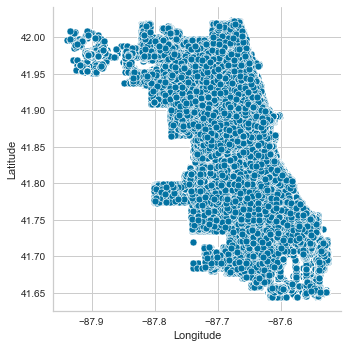

In [47]:
# Here we take the location as 'Longitude' and 'Latitude'
location = Chicago_crimes[['Latitude','Longitude']].copy()

# Clean the attributes to remove missing data and outliers
location = location.loc[(location['Latitude'] != None) & (location['Longitude'] != None)]
location = location.loc[(location['Longitude'] > -91 )] # Remove outliers
location = location.reset_index(drop=True)

# Plot the locations below
sns.relplot(y='Latitude', x='Longitude', data=location)

In [48]:
# We now overlay the crime locations over the map of Chicago

fig = px.scatter_mapbox(location.sample(100000), lat="Latitude", lon="Longitude",
                        color_discrete_sequence=["fuchsia"], zoom=8.4, height=350)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [49]:
# We will then find the scaled values for the location data

# Initialize the scaler
scaler = StandardScaler()

# Fit the data to the scaler
X = scaler.fit_transform(location)
scaled_location = pd.DataFrame(X, index=location.index,columns=location.columns)

scaled_location

,Latitude,Longitude
0,1.862028,-3.979227
1,0.477682,0.640578
2,-0.194777,1.100119
3,2.021098,-0.015126
4,-0.195336,1.097059
...,...,...
7074537,1.124829,-0.787639
7074538,1.365151,-1.622630
7074539,0.239643,-0.770981
7074540,0.256422,0.202753


Now, we will find the optimal number of clusters to be formed with the help of the elbow method. 


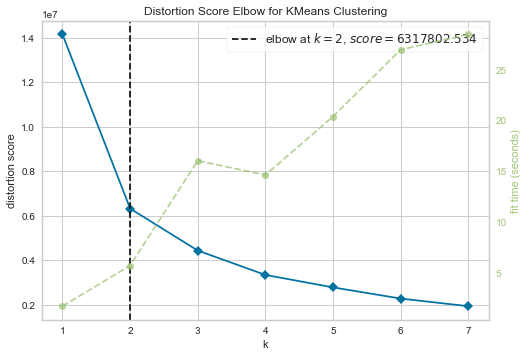

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [50]:
# Run the K-elbow visualizer next and plot the distortion over 8 clusters
visualizer = KElbowVisualizer( KMeans(random_state=0), k=(1,8))

# Fit the data to the visualizer
visualizer.fit(scaled_location)

# Render the plot
visualizer.show()

We see that the most of the distortion is covered with 4 clusters
 
This would mean that the best number of clusters in order to create groups with more similar members is 4. Therefore, we will execute the K-Means Clustering with 4 clusters.    

<Figure size 576x396 with 0 Axes>

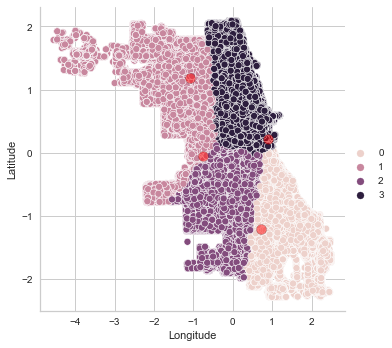

In [51]:
# Initialise and run the K-means algorithm with 4 clusters and fit location data to the algorithm
kmeans = KMeans(n_clusters=4, random_state=0).fit(scaled_location)

# Plot the clusters with labels below
plt.figure()
sns.relplot(x='Longitude', y='Latitude', hue=kmeans.labels_, data=scaled_location)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', edgecolor='black', s=100, alpha=0.5)

In [52]:
# Then we merge the location dataframe with the kmeans labels in order to depict incidents clustering on the real map
location['label'] = pd.DataFrame(kmeans.labels_)
kmeans.cluster_centers_ = scaler.inverse_transform(kmeans.cluster_centers_[:, :] )

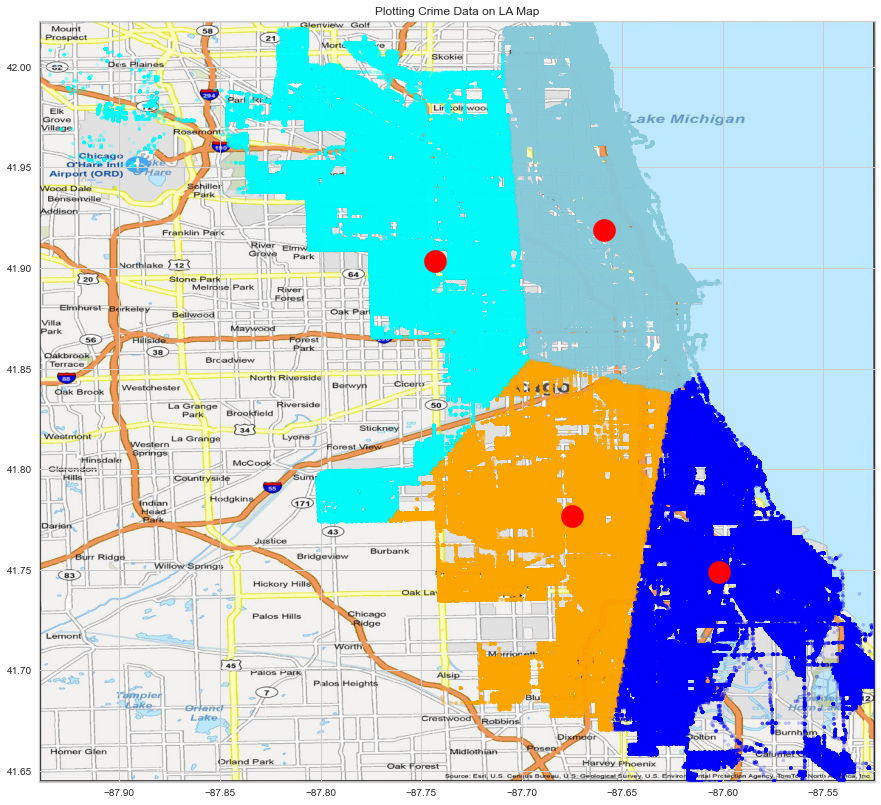

In [54]:
# We will now plot the color-coded clusters with the centroids on the Chicago city map 

# Find the coordinates of map
BBox = ((location.Longitude.min(), location.Longitude.max(), location.Latitude.min(), location.Latitude.max())) 

# Import the image of the map
chicago_map = plt.imread('Chicago-Map-Illinois.jpg') 
        
fig,ax1 = plt.subplots(figsize = (16,14))

# Create a new colormap
colormap = colors.ListedColormap(['blue','aqua' ,'purple','orange','c']) 
        
# Plot the clusters on the map with the lables        
ax1.scatter(location.Longitude, location.Latitude, zorder=1, alpha= 0.2, cmap=colormap,
           c=location.label, s=10, )
        
ax1.set_title('Plotting Crime Data on LA Map') 
        
# Plot the centroids on the map        
ax1.scatter(kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 0], zorder=1, alpha= 1,color='red',s=500, ) 

ax1.set_xlim(BBox[0],BBox[1])
ax1.set_ylim(BBox[2],BBox[3])
        
# Render the plot        
ax1.imshow(chicago_map, zorder=0, extent = BBox, aspect= 'equal')

We can see that the clusters on the map of Chicago and the centroids would represent the point from which the overall distance to all points within the cluster is minimized.
These centroids can be see as the ideal locations to assign resources such as police stations, response units.


## PART 2: Crime Similarity Analysis using K-Modes Clustering
    
K-Modes clustering is used here to perform clustering on categorical attributes such as 'Crime Description', 'Location' and 'Type of crime.
K-Modes form clusters based on the number of matching categories between data points. We want to identify specific attributes combinations e.g. crime type, premises etc.

In [55]:
# We will choose only the top 20 crime types based on the counts to find relations that appear more across many data points.
Crime_types = Chicago_crimes['Description'].value_counts()[:20].index
Crime_types = pd.DataFrame(crime_types, columns=['Description'])
Crime_types.head()

NameError: name 'crime_types' is not defined

In [56]:
# We will choose only the top 50 location descriptions based on the counts.

Location_desc = Chicago_crimes['Location Description'].value_counts()[:50].index
Location_desc = pd.DataFrame(Location_desc, columns=['Location Description'])
Location_desc

,Location Description
0,STREET
1,RESIDENCE
2,APARTMENT
3,SIDEWALK
4,OTHER
5,PARKING LOT/GARAGE(NON.RESID.)
6,ALLEY
7,"SCHOOL, PUBLIC, BUILDING"
8,RESIDENCE-GARAGE
9,SMALL RETAIL STORE


In [57]:
# We will choose only the top 30 Primary crime type based on the counts.

Primary_Type = Chicago_crimes['Primary Type'].value_counts()[:30].index
Primary_Type = pd.DataFrame(Primary_Type, columns=['Primary Type'])
Primary_Type

,Primary Type
0,THEFT
1,BATTERY
2,CRIMINAL DAMAGE
3,NARCOTICS
4,ASSAULT
5,OTHER OFFENSE
6,BURGLARY
7,MOTOR VEHICLE THEFT
8,DECEPTIVE PRACTICE
9,ROBBERY


In [58]:
# We will now merge the 3 attributes to form our dataframe to perform K-Modes

crimes_kmode = pd.merge (Chicago_crimes, Crime_types, on='Description' )
crimes_kmode = pd.merge (crimes_kmode, Location_desc, on='Location Description' )
crimes_kmode = pd.merge (crimes_kmode, Primary_Type, on='Primary Type' )
crimes_kmode

TypeError: Can only merge Series or DataFrame objects, a <class 'pandas.core.indexes.base.Index'> was passed

In [59]:
# We will now initializw K-Modes class and fit with the 3-attributes.
k_modes = KModes(n_clusters=10, init='Huang', n_init=3, verbose=1)

# Find the cluster centers for our three attributes
clusters = k_modes.fit_predict(crimes_kmode[['Description','Location Description','Primary Type']])

# Print the cluster centroids
print(km.cluster_centroids_)


NameError: name 'crimes_kmode' is not defined

Based on the clusters, we can gain the following insights such as:

1. 'Simple battery' and 'Simple assult' are the most common types of crimes occuring on the streets.
2. Thefts of "$500 and under" type which occur on the street are the majority followed by Motor Vehicle Thefts of automobiles
3. Most of 'Criminal Damage' cases takes place on residences where property is damaged and streets where vehicles are damaged.
4. Typically, domestic violance cases are of type 'Battery Simple' and are seen mostly at apartment units.
5. Generally, Criminal Tresspass concerns arise in parking lots/garages of non-residential units.
'POSS: CANNABIS 30GMS OR LESS' are the majority of the narcotic cases usually occuring on streets and sidewalks. 


## PART 3: District clustering based on safety
    
We will use the K-Means clustering algorithm again to cluster the police districts of Chicago city based on the safety. For this, we will find the frequency of crimes for each district to determine the safety of that district.


In [60]:
# We will select the top 100 different Crime types in the city

crime_types = Chicago_crimes['Description'].value_counts()[:100].index
crime_types = pd.DataFrame(crime_types, columns=['Description'])
crime_types

,Description
0,SIMPLE
1,$500 AND UNDER
2,DOMESTIC BATTERY SIMPLE
3,TO VEHICLE
4,TO PROPERTY
...,...
95,VEHICULAR HIJACKING
96,PAROLE VIOLATION
97,"CYCLE, SCOOTER, BIKE W-VIN"
98,"THEFT BY LESSEE,MOTOR VEH"


In [61]:
# Filter the dataframe with crimes falling under the selected crime_types

Chicago_crimes_clearedcrimes = pd.merge(Chicago_crimes, crime_types, on='Description')
Chicago_crimes_clearedcrimes

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,11034701,JA366925,01/01/2001 11:00:00 AM,016XX E 86TH PL,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,RESIDENCE,False,False,...,8.0,45.0,11,NaN,NaN,2001,08/05/2017 03:50:08 PM,NaN,NaN,NaN
1,11227633,JB147500,12/28/2017 03:55:00 PM,011XX S MICHIGAN AVE,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,NaN,False,False,...,2.0,32.0,11,NaN,NaN,2017,02/11/2018 03:57:41 PM,NaN,NaN,NaN
2,11227247,JB147078,01/01/2012 09:00:00 AM,105XX S INDIANAPOLIS AVE,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,RESIDENCE,False,False,...,10.0,52.0,11,NaN,NaN,2012,02/11/2018 03:57:41 PM,NaN,NaN,NaN
3,11028056,JA359834,10/15/2014 03:00:00 PM,047XX S PULASKI RD,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,PARKING LOT/GARAGE(NON.RESID.),False,False,...,14.0,57.0,11,NaN,NaN,2014,07/24/2017 03:54:23 PM,NaN,NaN,NaN
4,11042125,JA376558,12/16/2011 12:00:00 AM,003XX W 64TH ST,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,HOSPITAL BUILDING/GROUNDS,False,False,...,20.0,68.0,11,NaN,NaN,2011,08/05/2017 03:50:08 PM,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6892583,997,G468177,08/07/2001 09:38:00 PM,036XX W ROOSEVELT RD,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,False,False,...,24.0,29.0,01A,1152095.0,1894464.0,2001,03/19/2019 04:11:22 PM,41.866278,-87.717121,"(41.866277647, -87.717120788)"
6892584,998,G468610,08/08/2001 08:58:00 AM,007XX N WESTERN AVE,0110,HOMICIDE,FIRST DEGREE MURDER,AUTO,False,False,...,1.0,24.0,01A,1160278.0,1904683.0,2001,03/18/2019 04:08:09 PM,41.894154,-87.686798,"(41.894154398, -87.686797574)"
6892585,999,G470422,08/08/2001 09:36:00 PM,011XX N HARDING AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,True,False,...,27.0,23.0,01A,1149846.0,1907257.0,2001,03/19/2019 04:11:22 PM,41.901427,-87.725044,"(41.901427038, -87.725044239)"
6892586,24560,JC279072,05/26/2019 06:48:00 AM,013XX W HASTINGS ST,0110,HOMICIDE,FIRST DEGREE MURDER,CHA PARKING LOT,True,False,...,25.0,28.0,01A,1167752.0,1893853.0,2019,06/20/2020 03:48:45 PM,41.864278,-87.659660,"(41.864278228, -87.659660218)"


In [62]:
# Create a pivot table with the district and value counts for each crime types 

district_crimes = Chicago_crimes_clearedcrimes.pivot_table(index="District", columns="Description",aggfunc='count')
district_crimes = district_crimes.reset_index()
district_crimes = district_crimes.fillna(0)
district_crimes


District         Arrest                            \
Description          $500 AND UNDER AGG CRIMINAL SEXUAL ABUSE   
0                1.0        30149.0                      71.0   
1                2.0        29183.0                     227.0   
2                3.0        22892.0                     252.0   
3                4.0        27729.0                     323.0   
4                5.0        18775.0                     307.0   
5                6.0        28641.0                     312.0   
6                7.0        25536.0                     391.0   
7                8.0        36578.0                     467.0   
8                9.0        26283.0                     416.0   
9               10.0        22024.0                     435.0   
10              11.0        24622.0                     293.0   
11              12.0        41300.0                     254.0   
12              14.0        34506.0                     232.0   
13              15.0        16033.0                     250.0   
14              16.0        23661.0                     157.0   
15              17.0        21002.0                     230.0   
16              18.0        33298.0                      89.0   
17              19.0        36473.0                     138.0   
18              20.0        12101.0                      64.0   
19              21.0            0.0                       0.0   
20              22.0        19081.0                     183.0   
21              24.0        20133.0                     192.0   
22              25.0        31525.0                     463.0   
23              31.0           23.0                       0.0   

                                                                             \
Description AGG PO HANDS NO/MIN INJURY AGG: HANDS/FIST/FEET NO/MINOR INJURY   
0                                643.0                                169.0   
1                                769.0                                249.0   
2                               1057.0                                358.0   
3                               1131.0                                375.0   
4                               1064.0                                322.0   
5                               1511.0                                439.0   
6                               1712.0                                344.0   
7                               1181.0                                212.0   
8                                990.0                                200.0   
9                               1155.0                                178.0   
10                              1896.0                                296.0   
11                               790.0                                255.0   
12                               565.0                                150.0   
13                              1078.0                                196.0   
14                               467.0                                 77.0   
15                               392.0                                108.0   
16                               901.0                                289.0   
17                               778.0                                259.0   
18                               277.0                                103.0   
19                                 0.0                                  0.0   
20                               538.0                                215.0   
21                               618.0                                137.0   
22                              1077.0                                223.0   
23                                 1.0                                  0.0   

                                                                        \
Description AGGRAVATED AGGRAVATED DOMESTIC BATTERY: KNIFE/CUTTING INST   
0                805.0                                           116.0   
1                971.0                      

In [63]:
# Find the district codes for each of the districts

district_codes= pd.DataFrame()
district_codes['District'] = district_crimes['District'].copy()
district_crimes = district_crimes.drop(['District'], axis=1)
district_codes

/var/folders/sy/9xtd65ps6ys1lh6bfylyyrw40000gn/T/ipykernel_1220/393151278.py:5: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



,District
0,1.0
1,2.0
2,3.0
3,4.0
4,5.0
5,6.0
6,7.0
7,8.0
8,9.0
9,10.0


In [64]:
# Nomalize the count values for the disctricts using the standard scaler

scaler = StandardScaler()
X = scaler.fit_transform(district_crimes)
scaled_district_crimes = pd.DataFrame(X, index=district_crimes.index, columns=district_crimes.columns)
scaled_district_crimes

/Users/pramodcatari/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

/Users/pramodcatari/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.



Arrest                            \
Description $500 AND UNDER AGG CRIMINAL SEXUAL ABUSE   
0                 0.590559                 -1.253015   
1                 0.494159                 -0.092380   
2                -0.133640                  0.093620   
3                 0.349060                  0.621857   
4                -0.544488                  0.502818   
5                 0.440071                  0.540018   
6                 0.130213                  1.127775   
7                 1.232129                  1.693213   
8                 0.204759                  1.313774   
9                -0.220260                  1.455134   
10                0.039002                  0.398658   
11                1.703352                  0.108500   
12                1.025358                 -0.055180   
13               -0.818121                  0.078740   
14               -0.056899                 -0.613177   
15               -0.322249                 -0.070060   
16                0.904807                 -1.119095   
17                1.221651                 -0.754537   
18               -1.210507                 -1.305094   
19               -2.418103                 -1.781252   
20               -0.513951                 -0.419738   
21               -0.408969                 -0.352778   
22                0.727874                  1.663453   
23               -2.415808                 -1.781252   

                                                                             \
Description AGG PO HANDS NO/MIN INJURY AGG: HANDS/FIST/FEET NO/MINOR INJURY   
0                            -0.462377                            -0.415493   
1                            -0.191350                             0.311052   
2                             0.428140                             1.300969   
3                             0.587314                             1.455359   
4                             0.443197                             0.974024   
5                             1.404697                             2.036595   
6                             1.837049                             1.173823   
7                             0.694865                            -0.024975   
8                             0.284023                            -0.133957   
9                             0.638939                            -0.333756   
10                            2.232835                             0.737897   
11                           -0.146179                             0.365543   
12                           -0.630155                            -0.588047   
13                            0.473311                            -0.170284   
14                           -0.840954                            -1.251019   
15                           -1.002279                            -0.969483   
16                            0.092583                             0.674324   
17                           -0.171991                             0.401870   
18                           -1.249645                            -1.014892   
19                           -1.845474                            -1.950318   
20                           -0.688233                             0.002270   
21                           -0.516152                            -0.706110   
22                            0.471160                             0.074925   
23                           -1.843323                            -1.950318   

                                                                        \
Description AGGRAVATED AGGRAVATED DOMESTIC BATTERY: KNIFE/CUTTING INST   
0             0.460464                                       -0.998521   
1             1.016875                                        0.430063   
2             0.758781                                        1.521591   
3             0.131980                                        1.084087   
4            -0.219967                                        0.

/Users/pramodcatari/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

/Users/pramodcatari/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

/Users/pramodcatari/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

/Users/pramodcatari/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

/Users/pramodcatari/opt/anaconda

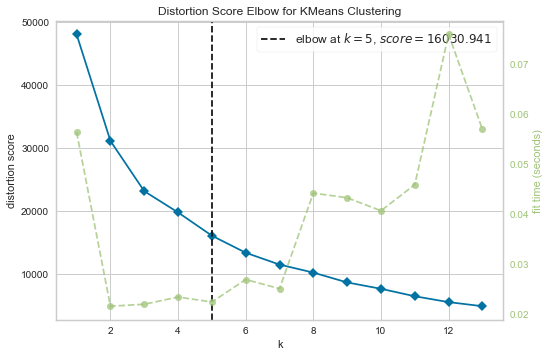

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [66]:
# We will again use the K-Elbow Visualizer to find the optimal number of clusters which is the perceived safety levels

kmeans = KMeans(random_state=0)
visualizer = KElbowVisualizer(kmeans, k=(1,14))

visualizer.fit(scaled_district_crimes)
visualizer.show()

In [67]:
# Initialize and run the K-Means algorithm on the scaled district crimes dataset
kmeans = KMeans(n_clusters=5, random_state=0, n_init=100).fit(scaled_district_crimes)

# Print the cluster centers
print(kmeans.cluster_centers_)

[[ 1.1050922  -0.75453678 -0.17199091 ... -0.85260522 -0.59786018
  -0.50183398]
 [-2.41695572 -1.78125241 -1.84439862 ... -1.34800371 -1.37436788
  -2.10436411]
 [ 0.26798773  0.8919282   0.65980338 ...  0.84810448  0.55441635
   0.88076559]
 [-0.38955901  0.23869898  1.35307284 ...  0.77431768  1.82301677
  -0.17284233]
 [-0.24786944 -0.469338   -0.82123643 ... -0.6538753  -0.67500342
  -0.37431784]]


/Users/pramodcatari/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.



In [68]:
# Set the cluster labels for each of the district
district_codes['label'] = pd.DataFrame(kmeans.labels_)
district_codes

,District,label
0,1.0,0
1,2.0,2
2,3.0,2
3,4.0,2
4,5.0,2
5,6.0,2
6,7.0,2
7,8.0,2
8,9.0,2
9,10.0,2


In [73]:
# Sort the clusters based on the average value of the centroids( lower means more safe ) where each attribute represent a crime type

idx_dic = {}

for i in range(len(kmeans.cluster_centers_)):
    
    idx_dic[i] = np.mean(kmeans.cluster_centers_[i])
    
print(idx_dic)    
idx_dic = [ i[0] for i in sorted(idx_dic.items(), key=lambda x: x[1]) ]   
print(idx_dic)
for i in range(len(kmeans.cluster_centers_)):
    
    district_codes.loc[i,'label'] = idx_dic[i]


{0: 0.05209313176625951, 1: -1.5992926267553271, 2: 0.4675445940422682, 3: 0.4631047259321017, 4: -0.4352404443068782}
[1, 4, 0, 3, 2]


In [74]:
# Merge the districe code attribute with the location attributes for each District

crime_data_district = pd.merge(district_codes, Chicago_crimes[['District','Latitude','Longitude']], on='District')
crime_data_district

,District,label,Latitude,Longitude
0,1.0,1,NaN,NaN
1,1.0,1,NaN,NaN
2,1.0,1,NaN,NaN
3,1.0,1,NaN,NaN
4,1.0,1,NaN,NaN
...,...,...,...,...
7143647,31.0,1,42.008885,-87.906473
7143648,31.0,1,42.008885,-87.906473
7143649,31.0,1,42.006949,-87.761717
7143650,31.0,1,41.997336,-87.884466


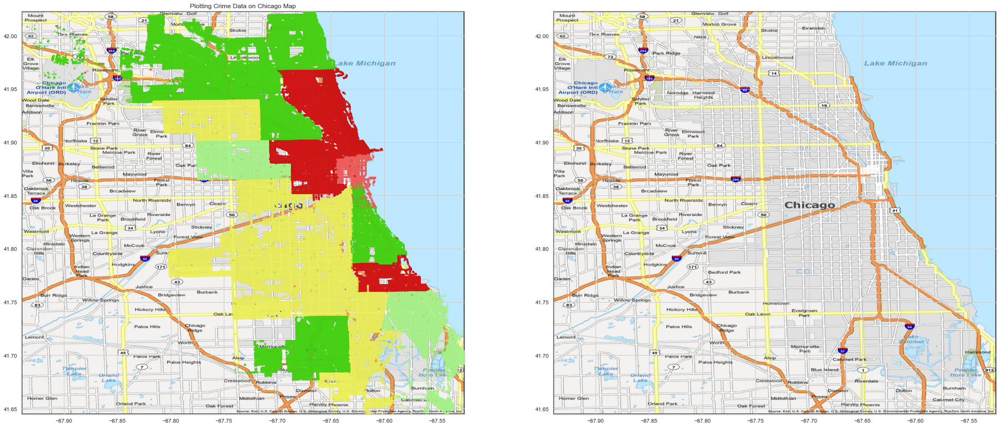

In [75]:
# Plot the districts with the clusters on the map of City of Chicago

BBox = ((-87.939732936, -87.524529378, 41.644585429, 42.022910333)) 
chicago_map = plt.imread('Chicago-Map-Illinois.jpg') #importing the map
fig, (ax1,ax2) = plt.subplots(1,2,figsize = (32,18))
colormap = colors.ListedColormap(['#d01616', '#ee5d5d', '#ebee5d', '#a7f38b', '#47d016']) 
ax1.scatter(crime_data_district.Longitude, crime_data_district.Latitude, zorder=1, alpha= 0.2, cmap=colormap,
           c=crime_data_district.label, s=10, )
ax1.set_title('Plotting Crime Data on Chicago Map')
ax1.set_xlim(BBox[0],BBox[1])
ax1.set_ylim(BBox[2],BBox[3])
ax1.imshow(chicago_map, zorder=0, extent = BBox, aspect= 'equal')
ax2.imshow(chicago_map, zorder=0, extent = BBox, aspect= 'equal')

As we can see the districts are color coded according to the clusters they belong. Red color represents more dangerous while green represents comparitively safer districts.